In [1]:
from cartoGRAPHs import *
import random 
from sklearn.decomposition import PCA
from sklearn import preprocessing
import json
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt 
import colorsys
import pickle as pk

_____
# G G N / gene-gene network 
_____

In [2]:
G = nx.read_weighted_edgelist("output/backbone_gene_graph_significant_weighted.edgelist")
print('G nodes: ',len(G.nodes())) 
print('G edges: ',len(G.edges()))

with open('output/Communities/Louvain/gg_com_first_louvain_genes.pickle', 'rb') as handle:
    first_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/gg_com_second_louvain_genes.pickle', 'rb') as handle:
    second_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/gg_com_third_louvain_genes.pickle', 'rb') as handle:
    third_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/gg_first_louvain_iteration.pickle', 'rb') as handle:
    gg_first_level_louvain = pickle.load(handle)

with open('output/Communities/Louvain/gg_second_louvain_iteration.pickle', 'rb') as handle:
    gg_second_level_louvain = pickle.load(handle)



G nodes:  22338
G edges:  762862


### calculate features based on communities 
+ #1 THIRD LEVEL COMMUNITIES 

In [3]:
layout_method = 'third-level-louvain' 

d_comm_third = {}
for g in G.nodes():
    for k,v in third_level_louvain.items():
        if g in v:
            d_comm_third[g] = k

d_communities_third = {}
for g in G.nodes():
    intermed_list = [0]*len(third_level_louvain.keys())
    for k,v in third_level_louvain.items():
        if g in v:
            intermed_list[k] = 1
    d_communities_third[g] = intermed_list
d_nodefeatures_third = d_comm_third

FM_communities_third = pd.DataFrame(d_communities_third).T

print(len(third_level_louvain))
FM_communities_third

81


,0,1,2,3,4,5,6,7,8,9,...,71,72,73,74,75,76,77,78,79,80
AR,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MYC,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABCB1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR1284,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MIR1301,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
MIR658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
MIR371B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


+ #2 SECOND LEVEL COMMUNITITES

In [4]:
layout_method = 'second-level-louvain' 

d_comm_second = {}
for g in G.nodes():
    for k,v in second_level_louvain.items():
        if g in v:
            d_comm_second[g] = k

d_communities_second = {}
for g in G.nodes():
    intermed_list = [0]*len(second_level_louvain.keys())
    for k,v in second_level_louvain.items():
        if g in v:
            intermed_list[k] = 1
    d_communities_second[g] = intermed_list
d_nodefeatures_second = d_comm_second

FM_communities_second = pd.DataFrame(d_communities_second).T

print(len(second_level_louvain))
FM_communities_second

82


,0,1,2,3,4,5,6,7,8,9,...,72,73,74,75,76,77,78,79,80,81
AR,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MYC,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABCB1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP8,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR1284,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR1301,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR371B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


+ #3 FIRST LEVEL COMMUNITIES

In [5]:
layout_method = 'first-level-louvain' 

d_comm_first = {}
for g in G.nodes():
    for k,v in first_level_louvain.items():
        if g in v:
            d_comm_first[g] = k

d_communities_first = {}
for g in G.nodes():
    intermed_list = [0]*len(first_level_louvain.keys())
    for k,v in first_level_louvain.items():
        if g in v:
            intermed_list[k] = 1
    d_communities_first[g] = intermed_list
d_nodefeatures_first = d_comm_first

FM_communities_first = pd.DataFrame(d_communities_first).T

print(len(first_level_louvain))
FM_communities_first

263


,0,1,2,3,4,5,6,7,8,9,...,253,254,255,256,257,258,259,260,261,262
AR,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MYC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ABCB1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CASP8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR1284,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR1301,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR658,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MIR371B,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
r = 0.9
alpha = 1.0

A = nx.adjacency_matrix(G, nodelist=list(G.nodes()))
DM_m = rnd_walk_matrix2(A, r, alpha, len(G.nodes()))
FM_structural = pd.DataFrame(DM_m)
FM_structural.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural.index=list(G.nodes())
FM_structural.columns=list(G.nodes())
FM_structural

,AR,MYC,ABCB1,CASP3,CASP8,AKT1,HIF1A,MAPK1,MAPK3,MAPK8,...,MIR302F,MIR937,MIR553,MIR890,MIR1184-1,MIR1284,MIR1301,MIR658,MIR371B,MIR4468
AR,0.900101,0.000557,0.001048,0.000846,0.000583,0.000662,0.000466,0.000778,0.000773,0.000502,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
MYC,0.001567,0.900077,0.001174,0.001254,0.001048,0.001172,0.000900,0.001176,0.001178,0.000799,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ABCB1,0.001366,0.000544,0.900084,0.001013,0.000768,0.000819,0.000564,0.000835,0.000827,0.000555,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CASP3,0.001180,0.000621,0.001084,0.900108,0.001785,0.001435,0.000597,0.001690,0.001668,0.000712,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CASP8,0.001157,0.000740,0.001170,0.002544,0.900089,0.001294,0.000732,0.001228,0.001226,0.000879,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MIR1284,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.090909,0.909091,0.000000,0.000000,0.000000,0.000000
MIR1301,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.909091,0.090909,0.000000,0.000000
MIR658,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.090909,0.909091,0.000000,0.000000
MIR371B,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.909091,0.090909


___ 
# 1 VIS 1 - Visualizing 1 selected community of each level
___

## Complete GGN network - Vis

In [7]:
########################################
# select which level :
########################################

layoutname = 'thirdlevel'
x_level_louvain = third_level_louvain
d_comm = d_comm_third
FM_communities = FM_communities_third

# set visualization parameters (i.e. colors for communities, node size, features.. )
colorlist_verybright = ['#FF355E','#FF6037','#FF9933',
               '#FFCC33', '#FFFF66', '#CCFF00','#A7F432',
                '#AAF0D1', '#50BFE6', '#FF6EFF',
                '#FF00CC', 
]

colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

colorlist_fin = colorlist_paper * (len(x_level_louvain.keys())//len(colorlist_paper)) +colorlist_paper

# #try to get unique colors for each community instead of hardcoded colors 
# colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(x_level_louvain.keys()))
# colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
# random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(x_level_louvain.keys(), colorlist_fin))
print(len(d_comm_col))

# match community colors assigned to nodes-community assignment
d_nodecolors_hex = {} 
for node,comm in d_comm.items():
    for com,col in d_comm_col.items():
        if comm == com:
            d_nodecolors_hex[node] = col 

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25

edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'

# get all subgraphs of all communities : 
nodes_allcommunities = []
subgraphs_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):

    nodes_comm0 = []
    for node, comm in d_comm.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_allcommunities.append(nodes_comm0)
    subgraphs_allcommunities.append(G_comm0)

number of unique colors: 16
81


### FEATURE MODULATED LAYOUT 
structural (global) with functional (communities)

In [8]:
scalar_val = 1
layout_method = 'modulated-scal'+str(scalar_val)
DF_structural = FM_structural
DF_functional = FM_communities.T
DF_merge = feature_modulation(DF_structural,DF_functional, scalar_val)

n_n = 8
spr = 1.0
md = 0.5
metr2D = 'cosine'

posG2D_modulated = layout_portrait_umap(G,
                                   DF_merge,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

posG2D_new = posG2D_modulated



/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [9]:

ggn_col_dict={}
for gene,pos in posG2D_new.items():
    for i,n_comm in enumerate(nodes_allcommunities):
        if gene in n_comm:
            ggn_col_dict[gene]=d_comm_col[i]



In [10]:
with open('output/ggn_col_dict.pickle', 'wb') as handle:
    pickle.dump(ggn_col_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)


In [10]:
#Let's change the names of these communities based on their size

#BROADEST==third
third_level_louvain_sort=dict(sorted(third_level_louvain.items(), key=lambda item: len(item[1]), reverse = True))
third_renamed_third_conversion_dict={}
renamed_third_level_louvain_sort={}
c=1
for com,explist in third_level_louvain_sort.items():
    renamed_third_level_louvain_sort[str(c)]=explist
    third_renamed_third_conversion_dict[com]=str(c)
    c=c+1
    
#MIDDLE==second

second_renamed_second_conversion_dict={}
renamed_second_level_louvain_sort={}

for br_com,mid_com in gg_second_level_louvain.items():
    if len(mid_com)==1:
        newcom=third_renamed_third_conversion_dict[br_com]
        renamed_second_level_louvain_sort[newcom]=second_level_louvain[mid_com[0]]
        second_renamed_second_conversion_dict[mid_com[0]]=newcom
    else:
        sorted_list=list(sorted(mid_com, key=lambda item: len(second_level_louvain[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=third_renamed_third_conversion_dict[br_com]+"_"+str(q)
            renamed_second_level_louvain_sort[newcom]=second_level_louvain[sorted_list[i]]
            second_renamed_second_conversion_dict[sorted_list[i]]=newcom
        
#FINEST==first  

first_renamed_first_conversion_dict={}
renamed_first_level_louvain_sort={}

for mid_com,fin_com in gg_first_level_louvain.items():
    if len(fin_com)==1:
        newcom=second_renamed_second_conversion_dict[mid_com]
        renamed_first_level_louvain_sort[newcom]=first_level_louvain[fin_com[0]]
        first_renamed_first_conversion_dict[fin_com[0]]=newcom
    else:
        sorted_list=list(sorted(fin_com, key=lambda item: len(first_level_louvain[item]), reverse = True))
        for i in range(len(sorted_list)):
            q=i+1
            newcom=second_renamed_second_conversion_dict[mid_com]+"_"+str(q)
            renamed_first_level_louvain_sort[newcom]=first_level_louvain[sorted_list[i]]
            first_renamed_first_conversion_dict[sorted_list[i]]=newcom
        

In [11]:
#We are using the new nomenclature
fine_grained_communities_list=[]
middle_communities_list=[]
broad_communities_list=[]

for com,explist in renamed_first_level_louvain_sort.items():
    comlist=com.split("_")
    if len(comlist)==1:
        fine_grained_communities_list.append(com)
    elif len(comlist)==2:
        fine_grained_communities_list.append(com)
        middle_communities_list.append(comlist[0])
    else:
        fine_grained_communities_list.append(com)
        middle_communities_list.append(comlist[0]+"_"+comlist[1])
        broad_communities_list.append(comlist[0])

fine_grained_communities_set=set(fine_grained_communities_list)
middle_communities_set=set(middle_communities_list)
broad_communities_set=set(broad_communities_list)
print(len(broad_communities_set))  
print(len(middle_communities_set))  
print(len(fine_grained_communities_set))  

1
14
263


In [12]:
third_renamed_third_conversion_dict_rev={}
for k,v in third_renamed_third_conversion_dict.items():
    third_renamed_third_conversion_dict_rev[v]=k

second_renamed_second_conversion_dict_rev={}
for k,v in second_renamed_second_conversion_dict.items():
    second_renamed_second_conversion_dict_rev[v]=k

first_renamed_first_conversion_dict_rev={}
for k,v in first_renamed_first_conversion_dict.items():
    first_renamed_first_conversion_dict_rev[v]=k

In [13]:
len(renamed_first_level_louvain_sort['5_1'])

703

In [ ]:
#5_19

In [30]:
second_renamed_second_conversion_dict_rev['5']

31

In [29]:
first_renamed_first_conversion_dict_rev['5_19']

249

In [99]:
first_renamed_first_conversion_dict_rev['5_16']

222

In [54]:
third_renamed_third_conversion_dict_rev['5']

9

In [58]:
renamed_second_level_louvain_sort['5'] in renamed_third_level_louvain_sort['5']

False

In [59]:
len(renamed_second_level_louvain_sort['5'])

1786

In [60]:
len(renamed_third_level_louvain_sort['5'])

1786

In [61]:
len(renamed_second_level_louvain_sort['5']) == len(renamed_third_level_louvain_sort['5'])

True

In [64]:
len(third_level_louvain_sort[9])

1786

In [56]:
renamed_second_level_louvain_sort['5']

{'MIR557',
 'H2AFY',
 'PTRF',
 'FREQ',
 'CLVS2',
 'ZSWIM2',
 'TMCO5A',
 'ZNF705A',
 'KBTBD13',
 'MIR421',
 'RAB6D',
 'MAJIN',
 'NXPE4',
 'CD207',
 'OR5C1',
 'SNORD32B',
 'OR5T2',
 'CER1',
 'LINC02388',
 'SNORD18A',
 'S100Z',
 'SNORD114-8',
 'OPTC',
 'BFSP2-AS1',
 'MS4A8',
 'SCGB1D4',
 'CYP2U1-AS1',
 'OR2T1',
 'CSN2',
 'FAM138D',
 'IGLC1',
 'NOX3',
 'SUN5',
 'IGSF22',
 'LINC01474',
 'GAPDHP23',
 'RNF133',
 'HKR1',
 'KIAA1614',
 'MIR181A1',
 'SMIM2',
 'BTLA',
 'CYP26C1',
 'GDNF-AS1',
 'LUZP4',
 'ADAM2',
 'BSX',
 'C4ORF17',
 'TTTY8B',
 'TTC36',
 'LINC01260',
 'EXOC3L',
 'LINC00474',
 'DCAF13P3',
 'VTRNA2-1',
 'LINC01556',
 'RABGAP1L-DT',
 'OR10H5',
 'ABO',
 'H1-7',
 'PRKAG3',
 'SNORD13P3',
 'OR4F15',
 'NPAP1',
 'RNU7-1',
 'MIR4700',
 'CD300E',
 'SPZ1',
 'ERV3',
 'CELA3B',
 'C12ORF42',
 'SMR3B',
 'GBAS',
 'TUBBP6',
 'FREM3',
 'MIR3976HG',
 'LDLRAD2',
 'NMUR2',
 'C16ORF78',
 'ACNATP',
 'OR2A14',
 'PAPD5',
 'GRPEL2-AS1',
 'SLC22A13',
 'MKL2',
 'MIR4326',
 'SNORD114-21',
 'TBC1D3D',
 'VN1R4',

In [98]:
len(renamed_first_level_louvain_sort['5_19'])

13

In [36]:
renamed_second_level_louvain_sort['5']

{'MIR557',
 'H2AFY',
 'PTRF',
 'FREQ',
 'CLVS2',
 'ZSWIM2',
 'TMCO5A',
 'ZNF705A',
 'KBTBD13',
 'MIR421',
 'RAB6D',
 'MAJIN',
 'NXPE4',
 'CD207',
 'OR5C1',
 'SNORD32B',
 'OR5T2',
 'CER1',
 'LINC02388',
 'SNORD18A',
 'S100Z',
 'SNORD114-8',
 'OPTC',
 'BFSP2-AS1',
 'MS4A8',
 'SCGB1D4',
 'CYP2U1-AS1',
 'OR2T1',
 'CSN2',
 'FAM138D',
 'IGLC1',
 'NOX3',
 'SUN5',
 'IGSF22',
 'LINC01474',
 'GAPDHP23',
 'RNF133',
 'HKR1',
 'KIAA1614',
 'MIR181A1',
 'SMIM2',
 'BTLA',
 'CYP26C1',
 'GDNF-AS1',
 'LUZP4',
 'ADAM2',
 'BSX',
 'C4ORF17',
 'TTTY8B',
 'TTC36',
 'LINC01260',
 'EXOC3L',
 'LINC00474',
 'DCAF13P3',
 'VTRNA2-1',
 'LINC01556',
 'RABGAP1L-DT',
 'OR10H5',
 'ABO',
 'H1-7',
 'PRKAG3',
 'SNORD13P3',
 'OR4F15',
 'NPAP1',
 'RNU7-1',
 'MIR4700',
 'CD300E',
 'SPZ1',
 'ERV3',
 'CELA3B',
 'C12ORF42',
 'SMR3B',
 'GBAS',
 'TUBBP6',
 'FREM3',
 'MIR3976HG',
 'LDLRAD2',
 'NMUR2',
 'C16ORF78',
 'ACNATP',
 'OR2A14',
 'PAPD5',
 'GRPEL2-AS1',
 'SLC22A13',
 'MKL2',
 'MIR4326',
 'SNORD114-21',
 'TBC1D3D',
 'VN1R4',

In [75]:
list(renamed_first_level_louvain_sort['5_1']) in list(renamed_second_level_louvain_sort['5'])

False

In [14]:

gg_fine_grained_dict = {}
for fg_com in fine_grained_communities_set:
    gg_fine_grained_dict[fg_com] = first_level_louvain[first_renamed_first_conversion_dict_rev[fg_com]]

gg_middle_dict = {}
for fg_com in middle_communities_set:
    gg_middle_dict[fg_com] = second_level_louvain[second_renamed_second_conversion_dict_rev[fg_com]]

gg_broad_dict = {}
for fg_com in broad_communities_set:
    gg_broad_dict[fg_com] = third_level_louvain[third_renamed_third_conversion_dict_rev[fg_com]]


In [82]:
len(gg_fine_grained_dict['5_1'])

703

In [84]:
len(gg_middle_dict['5'])

1786

In [91]:
len(gg_fine_grained_dict['5_1'] & gg_middle_dict['5'])

703

In [21]:
#Let's save these communities

with open('output/Communities/Louvain/gg_Louvain_fine_grained_dict.pickle', 'wb') as handle:
    pk.dump(gg_fine_grained_dict, handle, protocol=pk.HIGHEST_PROTOCOL)
    
with open('output/Communities/Louvain/gg_Louvain_middle_dict.pickle', 'wb') as handle:
    pk.dump(gg_middle_dict, handle, protocol=pk.HIGHEST_PROTOCOL)
    
with open('output/Communities/Louvain/gg_Louvain_broad_dict.pickle', 'wb') as handle:
    pk.dump(gg_broad_dict, handle, protocol=pk.HIGHEST_PROTOCOL)

In [22]:
tot_v=[]
for k,v in renamed_second_level_louvain_sort.items():
    tot_v.extend(v)
len(tot_v)

22338

In [15]:
tremap_color_dict={}
for com,explist in renamed_third_level_louvain_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(ggn_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)

for com,explist in renamed_second_level_louvain_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(ggn_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
        
for com,explist in renamed_first_level_louvain_sort.items():
    col_list=[]
    for exp in explist:
        col_list.append(ggn_col_dict[exp])
    if len(set(col_list))==1:
        tremap_color_dict[com]=col_list[0]
    else:
        print("%s is multicolor"%com)
len(tremap_color_dict)

278

In [16]:

color_list=[]
com_list=[]
value_list=[]
parent_list=[]

for com, color in tremap_color_dict.items():
    com_list.append(com)
    color_list.append(color)
    
    comgrouplist=com.split("_")
    if len(comgrouplist)==1:
        value_list.append(len(renamed_third_level_louvain_sort[com]))
        parent_list.append("")
    
    elif len(comgrouplist)==2:
        try:
            value_list.append(len(renamed_second_level_louvain_sort[com]))
            oldcom=second_renamed_second_conversion_dict_rev[com]
            for brcom,midcomlist in gg_second_level_louvain.items():
                if oldcom in midcomlist:
                    parent_list.append(third_renamed_third_conversion_dict[brcom])
        except:
            value_list.append(len(renamed_first_level_louvain_sort[com]))
            oldcom=first_renamed_first_conversion_dict_rev[com]
            for midcom,fincomlist in gg_first_level_louvain.items():
                if oldcom in fincomlist:
                    parent_list.append(second_renamed_second_conversion_dict[midcom])
            
        
    else:
        value_list.append(len(renamed_first_level_louvain_sort[com]))
        oldcom=first_renamed_first_conversion_dict_rev[com]
        for midcom,fincomlist in gg_first_level_louvain.items():
            if oldcom in fincomlist:
                parent_list.append(second_renamed_second_conversion_dict[midcom])

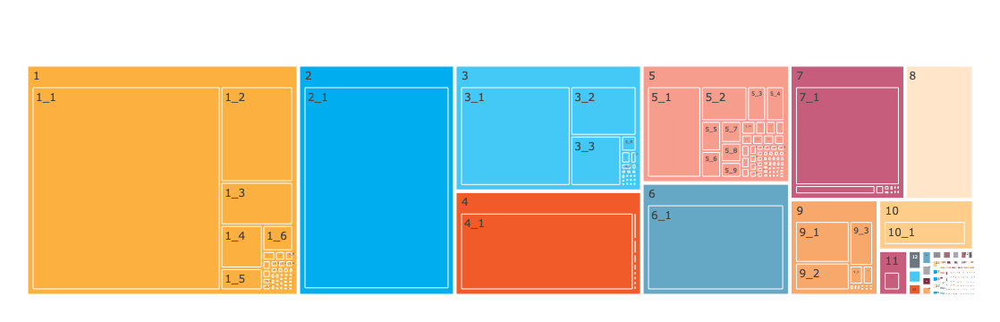

In [26]:
import plotly.graph_objects as go


fig = go.Figure(go.Treemap(
    branchvalues = "total",
    labels = com_list,
    values = value_list,
    parents = parent_list,
    marker_colors = color_list
))

fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.write_image('output/Figures/SF6B_v01_post_rev.pdf')
fig.show()

In [17]:
# --- build source data table ---
source_df = pd.DataFrame({
    "label": com_list,
    "parent": parent_list,
    "value": value_list,
    "color": color_list
})


# optional metadata (recommended)
source_df["figure"] = "SF13B"
source_df["description"] = "Treemap of the GGN"

# --- write to excel ---
with pd.ExcelWriter("output/Source_Data_exposurome.xlsx", engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    source_df.to_excel(writer, sheet_name="SF13B", index=False)
print("Source data for treemap exported.")

Source data for treemap exported.


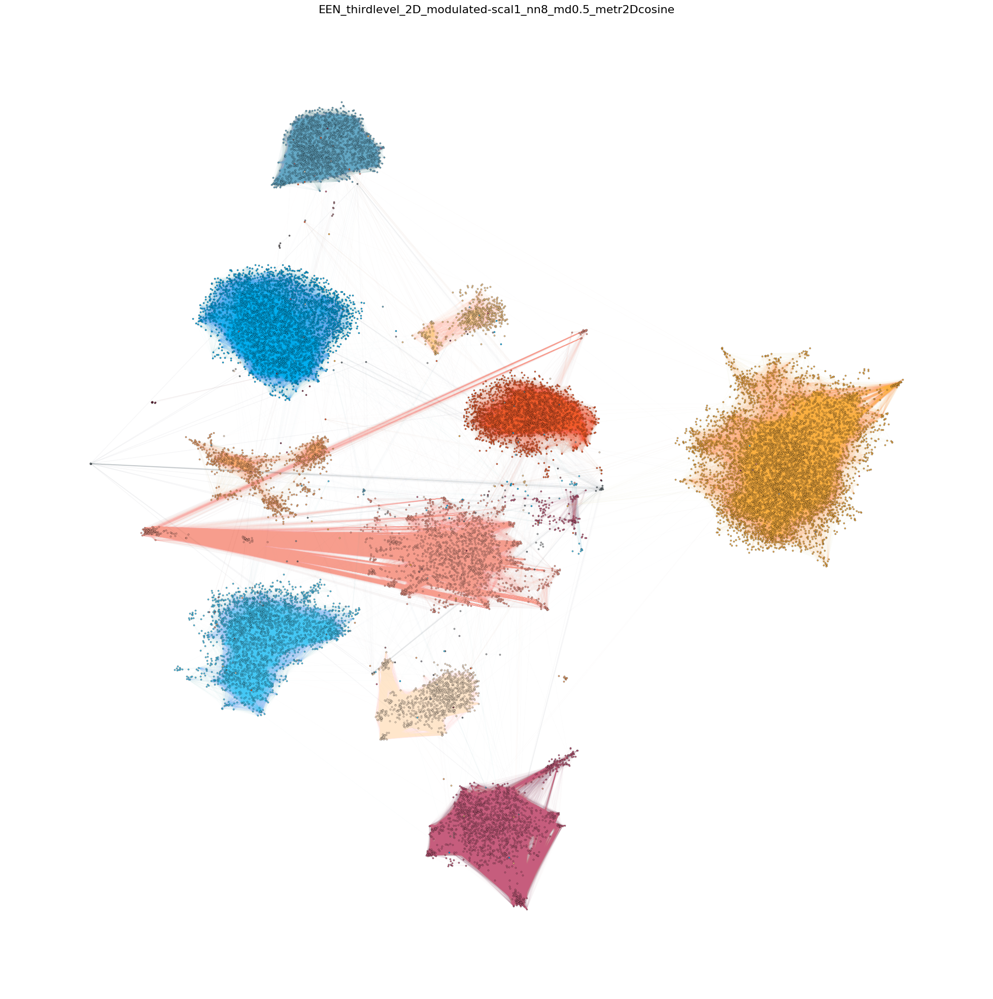

In [18]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# all edges 
nx.draw_networkx_edges(G,posG2D_new, width = 0.05, edge_color = '#a9a9a9', alpha = 0.01)


# draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 1, edge_color = colors_allcommunities[i], alpha = 0.01)

plt.box(False)
#plt.savefig('output/Figures/SF6A_part1_v01_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/SF6A_part1_v01_post_rev.png',dpi=300)
plt.show()

In [19]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_new.items():

    community_id = d_comm.get(node)
    node_color = d_comm_col.get(community_id)

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 5,
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None
    })


# ----------------------------
# EDGES (ALL EDGES)
# ----------------------------
for u, v in G.edges():

    comm_u = d_comm.get(u)
    comm_v = d_comm.get(v)

    # determine edge style exactly like plot
    if comm_u == comm_v:
        edge_color = d_comm_col.get(comm_u)
        edge_width = 1
    else:
        edge_color = "#a9a9a9"
        edge_width = 0.05

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width
    })


df_network = pd.DataFrame(rows)


# ----------------------------
# SAVE SAFELY (append, no overwrite)
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(
    out_file,
    engine="openpyxl",
    mode="a",
    if_sheet_exists="replace"   
) as writer:

    df_network.to_excel(
        writer,
        sheet_name="SF13A_part1",
        index=False
    )

print("Network source data saved safely.")

Network source data saved safely.


In [68]:
check_colors_allcommunities=[]
for i in range(len(colors_allcommunities)):
    if i==9:    #this corresponds to the community 5
        check_colors_allcommunities.append(colors_allcommunities[9])
    else:
        check_colors_allcommunities.append("grey")

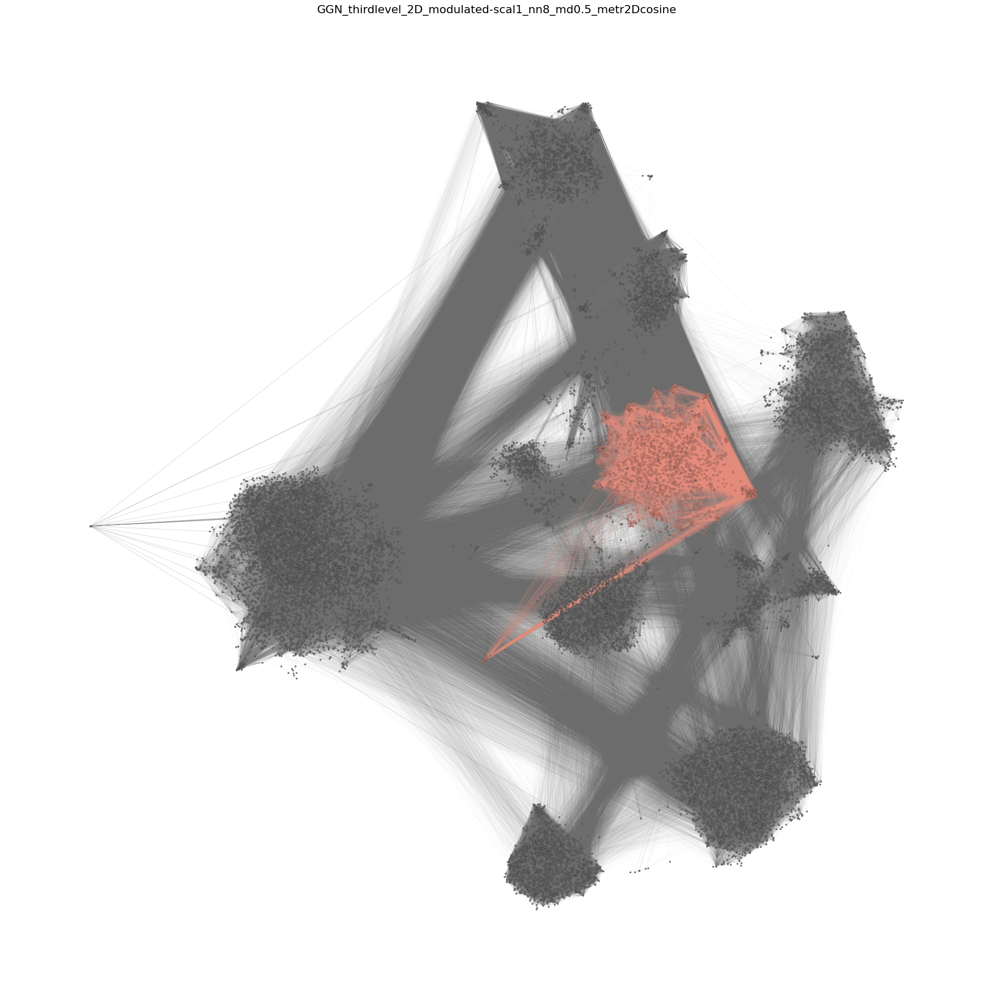

In [69]:
fname = 'GGN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = check_colors_allcommunities[i], node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color = check_colors_allcommunities[i], alpha = 0.075)

plt.box(False)

#plt.savefig(path+fname+'focus.png',dpi=300)
plt.show()

In [13]:
pos2D_allcommunities = []
colors_allcommunities = []

for number_of_community in range(min(d_comm.values()),max(d_comm.values())+1):
    for i,n_comm in enumerate(nodes_allcommunities):
        pos_comm = []
        if i == number_of_community:
            # get positions from community nodes 
            posG2D_comm0 = {}
            for k,v in posG2D_new.items():
                if k in n_comm:
                    posG2D_comm0[k] = v 
        pos_comm.append(posG2D_comm0)

        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col

    pos2D_allcommunities.append(pos_comm)
    colors_allcommunities.append(comm0_color)

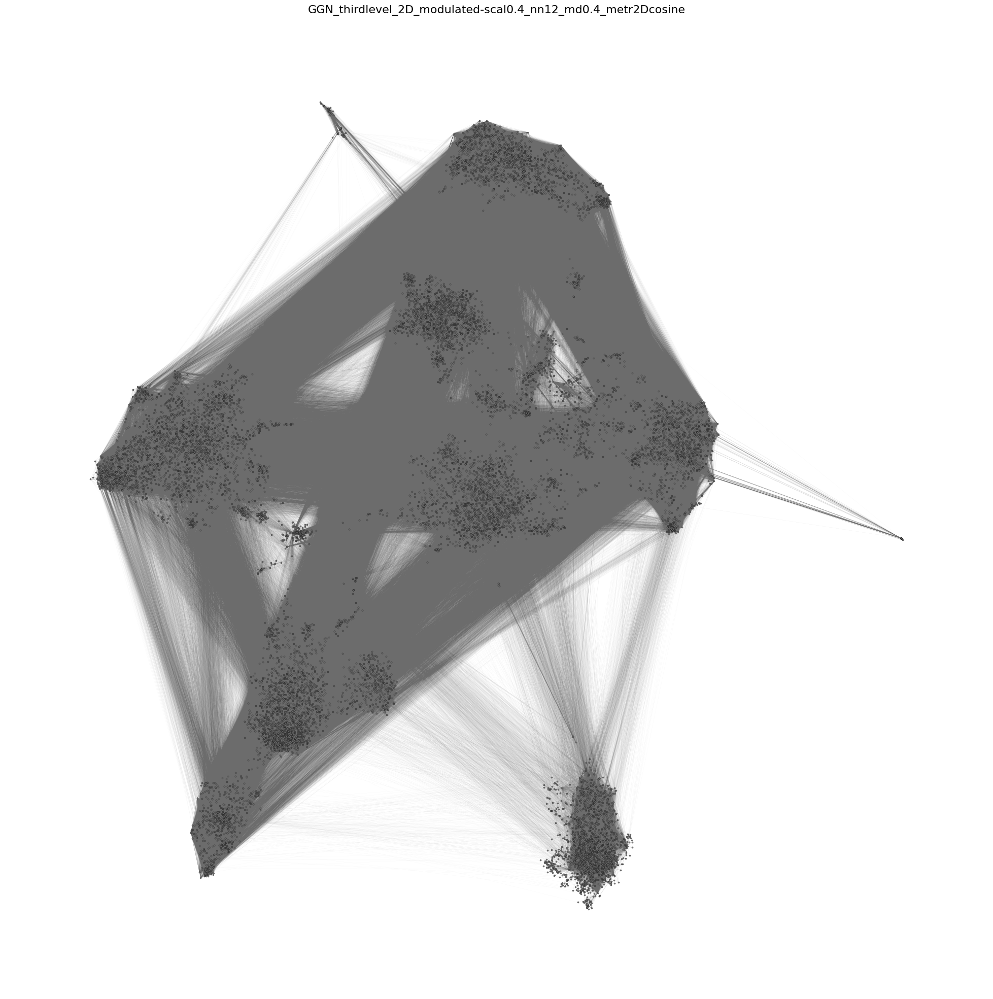

In [14]:
fname = 'GGN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# FIRST: draw network edges all (very transparent)
nx.draw_networkx_edges(G,posG2D_new, width = 0.1, edge_color = '#6C6C6C', alpha = 0.1)

# SECOND: draw network edges within communities 
for i in range(len(subgraphs_allcommunities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), edgecolors = node_edge_col, linewidths = node_linewidth, node_color = '#6C6C6C', node_size = 5, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities[i],dict(*pos2D_allcommunities[i]), width = 0.5, edge_color ='#6C6C6C', alpha = 0.075)

plt.box(False)

#plt.savefig(path+fname+'focus.png',dpi=300)
plt.show()

# Specific Communities per Level - Vis

### THIRD LEVEL

Number of exposures in community: 1786
Specific Graph: Graph with 1786 nodes and 49153 edges


/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of Nodes: (to match G_sub_third nodes):  1786
communities of second level in third level community selected:  {31}
colorlist fin: ['#44c8f5', '#00aeef', '#64a8c5', '#f15a29', '#f9a86b', '#ffe6cb', '#fbb040', '#fecd8a', '#c65d7d', '#f79d8d', '#7a2d45', '#a47179', '#676267', '#6b777e', '#93909a', '#a7a9ac']
number of unique colors: 16
16
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1


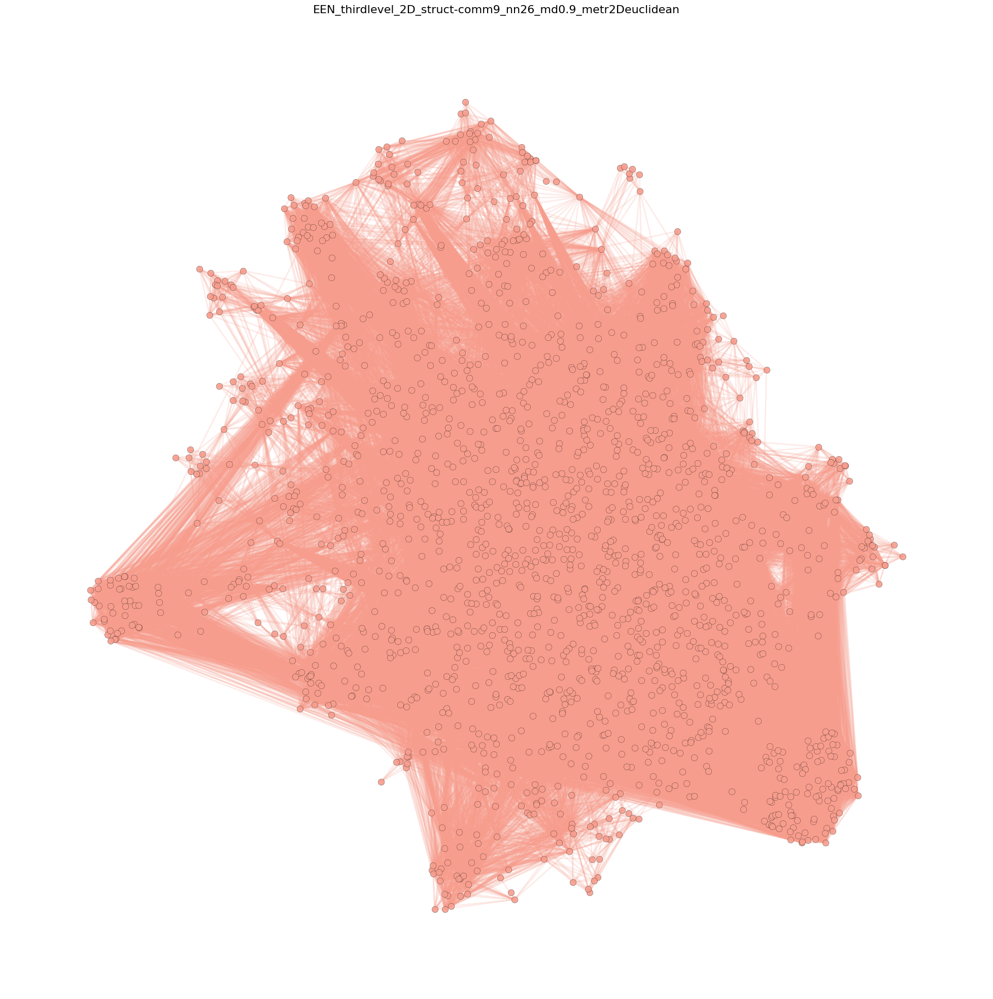

In [20]:
layoutname = 'thirdlevel'

##########################################################
spec_comm_third = 9 #Salvo's selection 5
##########################################################

sublist_third = []
for k,v in d_comm_third.items():
    if v == spec_comm_third:
        sublist_third.append(k)

d_selectedcommunity_thirdlevel = {spec_comm_third:sublist_third}
print("Number of exposures in community:" , len(*d_selectedcommunity_thirdlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_third.values()),max(d_comm_third.values())):
    nodes_comm0 = []
    for node, comm in d_comm_third.items(): 
        if comm == number_of_community:
            nodes_comm0.append(node)
            G_comm0 = G.subgraph(nodes_comm0)

    nodes_subcommunities.append(nodes_comm0)
    subgraphs_subcommunities.append(G_comm0)
    
G_sub_third = subgraphs_subcommunities[spec_comm_third]
print("Specific Graph:" , G_sub_third)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_third) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_third, nodelist=list(G_sub_third.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_third.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_third.nodes())
FM_structural_sub.columns=list(G_sub_third.nodes())

n_n = 26 
spr = 1.0
md = 0.9
metr2D = 'euclidean'
posG2D_third = layout_portrait_umap(G_sub_third,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_third nodes): ', len(posG2D_third))



########################################
# COLORS 
########################################

# get all nodes of 3rd level subgraph - and their second level assigned communities
d_comm_second_selected = {}
for node in G_sub_third.nodes():
    if node in d_comm_second.keys():    
        d_comm_second_selected[node] = d_comm_second[node]
print("communities of second level in third level community selected: ", set(d_comm_second_selected.values()))

set_communities = set(d_comm_second_selected.values())




colorlist_paper = ['#44c8f5', '#00aeef', '#64a8c5', # blues
                    '#f15a29','#f9a86b', '#ffe6cb' ,#reds
                    '#fbb040', '#fecd8a' , #orange-yellows
                    '#c65d7d', '#f79d8d', '#7a2d45','#a47179', #pinks 
                    '#676267', '#6b777e', '#93909a', '#a7a9ac' #greys    
                ]

#colorlist_fin = [colorlist_paper[4],colorlist_paper[1]] # * (len(x_level_louvain.keys())//len(colorlist_paper)) +colorlist_paper
colorlist_fin = colorlist_paper
print("colorlist fin:" , colorlist_fin)
# colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(x_level_louvain.keys()))
# colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)

print("number of unique colors:" ,len(set(colorlist_fin)))

# assign random color to each community
d_comm_col = dict(zip(x_level_louvain.keys(), colorlist_fin))
print(len(d_comm_col))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'



########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_secondlevel = []
subgraphs_allcommunities_secondlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_second.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_third.subgraph(nodes_comm)

    nodes_allcommunities_secondlevel.append(nodes_comm)
    subgraphs_allcommunities_secondlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_secondlevel))
print("Number of second level communities: ", len(nodes_allcommunities_secondlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_secondlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items():
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_secondlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_secondlevel))

# colors_allcommunities_secondlevel = []
# for idx,number_of_community in enumerate(list(set_communities)):
#     for i,n_comm in enumerate(nodes_allcommunities_secondlevel):
#         # get color from community  
#         for comm, col in d_comm_col.items():
#             if comm == number_of_community:
#                 comm0_color = col
#     colors_allcommunities_secondlevel.append(comm0_color)

# print("Number of individual colors: ", len(set(colors_allcommunities_secondlevel)))
# print("colors_allcommunities_secondlevel: ", colors_allcommunities_secondlevel)
colors_allcommunities_secondlevel = colorlist_fin
########################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.5)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_secondlevel[i],
                            dict(*pos2D_allcommunities_secondlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth, 
                            node_color = colors_allcommunities[9], 
                            node_size = 80, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_secondlevel[i],dict(*pos2D_allcommunities_secondlevel[i]), width = 2, edge_color = colors_allcommunities[9], alpha = 0.2)

plt.box(False)


#plt.savefig('output/Figures/SF6A_part2_v01_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/SF6A_part2_v01_post_rev.png',dpi=300)
plt.show()


In [21]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_third.items():
    # get second-level community and color
    community_id = d_comm_second_selected.get(node)
    node_color = d_comm_col.get(community_id)

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 80,
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None
    })

# ----------------------------
# EDGES (ALL EDGES in the subgraph)
# ----------------------------
for u, v in G_sub_third.edges():
    comm_u = d_comm_second_selected.get(u, -1)
    comm_v = d_comm_second_selected.get(v, -1)

    if comm_u == comm_v and comm_u != -1:
        edge_color = d_comm_col.get(comm_u, "#000000")
        edge_width = 2
        edge_alpha = 0.2
    else:
        edge_color = "#a9a9a9"
        edge_width = 0.1
        edge_alpha = 0.01

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })

# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork[df_subnetwork['row_type']=='node']))
print("Edges:", len(df_subnetwork[df_subnetwork['row_type']=='edge']))

# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork.to_excel(writer, sheet_name="SF13A_part2", index=False)

print("Third-level subnetwork saved successfully in Excel!")

Nodes: 1786
Edges: 49153
Third-level subnetwork saved successfully in Excel!


In [ ]:
# match community colors assigned to nodes-community assignment
d_nodecolors_hex = {} 
for node,comm in d_comm_second_selected.items():
    for com,col in d_comm_col.items():
        if comm == com:
            d_nodecolors_hex[node] = col 

d_nodecolors_hex_sorted = {key:d_nodecolors_hex[key] for key in posG2D_third}

# export postitions 
df_posG_export = pd.DataFrame(posG2D_third).T
df_posG_export[3]= list(d_nodecolors_hex_sorted.values())
df_posG_export
df_posG_export.to_csv('GGN_posG_'+layout_method+'_'+layoutname+'.csv',header=None,index=0)

### SECOND LEVEL

Number of exposures in community: 1786
Specific Graph: Graph with 1786 nodes and 49153 edges
communities of second level in third level community selected:  {2, 130, 260, 6, 11, 13, 141, 16, 17, 18, 146, 22, 26, 27, 157, 30, 31, 33, 42, 174, 175, 176, 58, 60, 191, 65, 194, 66, 193, 199, 200, 201, 74, 202, 204, 206, 208, 212, 85, 89, 90, 219, 91, 93, 221, 222, 96, 95, 226, 224, 228, 229, 233, 234, 109, 240, 112, 245, 117, 120, 249, 250, 252}
{2: '#f79d8d', 130: '#f49d8e', 260: '#f29c8f', 6: '#ef9c90', 11: '#ec9b91', 13: '#e99b92', 141: '#e69a93', 16: '#e49a94', 17: '#e19995', 18: '#de9996', 146: '#db9897', 22: '#d99898', 26: '#d69799', 27: '#d3979a', 157: '#d0969b', 30: '#ce969c', 31: '#cb959d', 33: '#c8959e', 42: '#c6949f', 174: '#c394a0', 175: '#c093a1', 176: '#bd93a2', 58: '#ba93a3', 60: '#b892a4', 191: '#b592a5', 65: '#b291a6', 194: '#b091a7', 66: '#ad90a8', 193: '#aa90a9', 199: '#a78faa', 200: '#a48fab', 201: '#a28eac', 74: '#9f8eae', 202: '#9c8daf', 204: '#9a8db0', 206: '#978cb1',

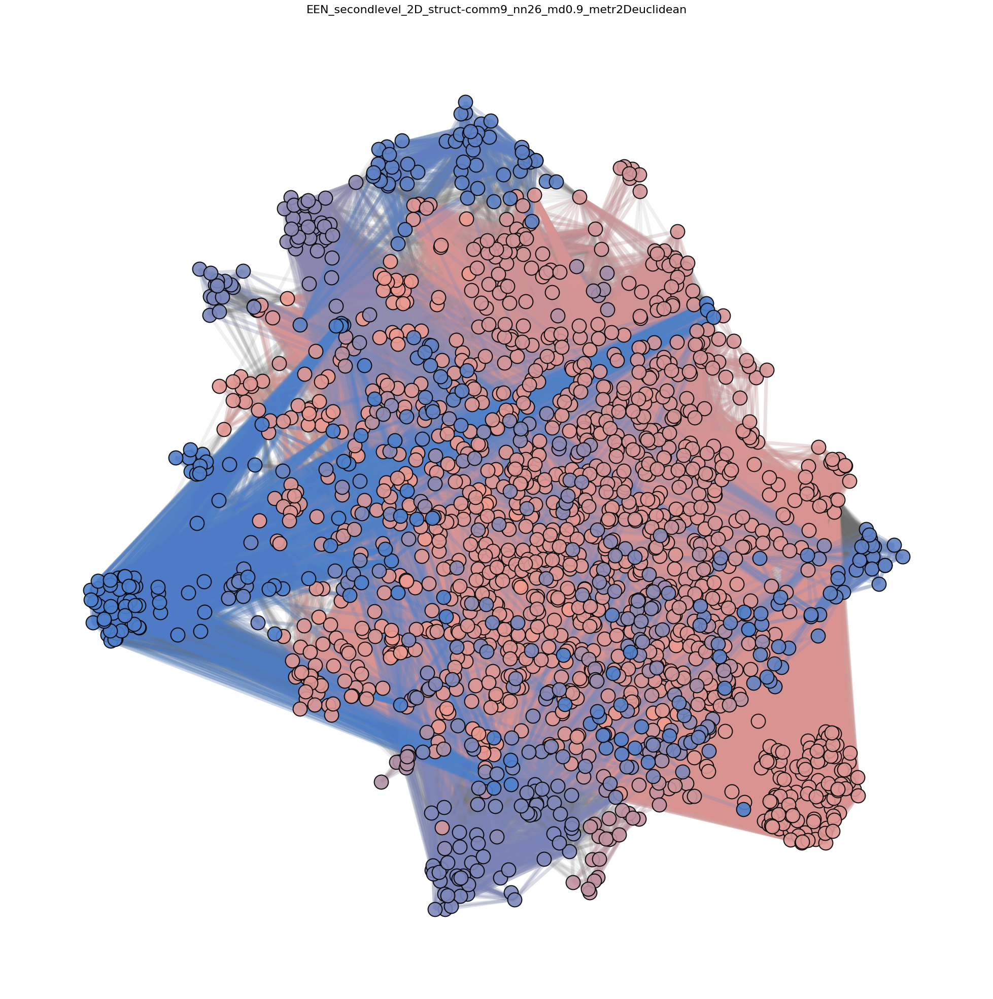

In [22]:
layoutname = 'secondlevel'

##########################################################
spec_comm_second = 31 #Salvo's selection 5
##########################################################


sublist_second = []
for k,v in d_comm_second.items():
    if v == spec_comm_second:
        sublist_second.append(k)

d_selectedcommunity_secondlevel = {spec_comm_second:sublist_second}
print("Number of exposures in community:" , len(*d_selectedcommunity_secondlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_second.values()),max(d_comm_second.values())):
    nodes_comm = []
    for node, comm in d_comm_second.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_second = subgraphs_subcommunities[spec_comm_second]
print("Specific Graph:" , G_sub_second)


# ########################################
# # LAYOUT 
# ########################################

# layout_method = 'struct-comm'+str(spec_comm_second) 

# r = 0.9
# alpha = 1.0

# A_sub = nx.adjacency_matrix(G_sub_second, nodelist=list(G_sub_second.nodes()))
# DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_second.nodes()))
# FM_structural_sub = pd.DataFrame(DM_m_sub)
# FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
# FM_structural_sub.index=list(G_sub_second.nodes())
# FM_structural_sub.columns=list(G_sub_second.nodes())

# n_n = 50
# spr = 1.0
# md = 0.9
# metr2D = 'cosine'
# posG2D_second = layout_portrait_umap(G_sub_second,
#                                    FM_structural_sub, #FM_communities_sub, #df_posG,
#                                    2,
#                                    n_neighbors=n_n, 
#                                    spread=spr, 
#                                    min_dist=md, 
#                                    metric=metr2D
#                                   )

# print('Number of Nodes: (to match G_sub_second nodes): ', len(posG2D_second))


# # add a small number to all positions to move them away from each other 
# posG2D_third_mod = {}
# for k,v in posG2D_third.items():
#     jitter = random.uniform(0,0.02)

#     posG2D_third_mod[k] = (v[0]+jitter, v[1]+jitter)
    

########################################
# COLORS 
########################################

# get all nodes of 2nd level subgraph - and their first level assigned communities
d_comm_first_selected = {}
for node in G_sub_second.nodes():
    if node in d_comm_first.keys():    
        d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get color of community of previous level
# then generate gradients of this color based on number of communities in this level
color_previous = colors_allcommunities[9] #d_comm_col[spec_comm_third]
num_colors = len(set(d_comm_first_selected.values()))
color_rgb = mcolors.hex2color(color_previous)


end_color = (0.0,0.1,0.4) # You can change this to (0, 0, 0) for a dark palette or any other color
end_color = (0.3,0.5,0.8) # You can change this to (0, 0, 0) for a dark palette or any other color


colorlist_rgb = [np.array(color_rgb) * (1 - i) + np.array(end_color) * i for i in np.linspace(0, 1, num_colors)]
colorlist_hex = [mcolors.to_hex(rgb) for rgb in colorlist_rgb]
d_comm_col = dict(zip(set_communities, colorlist_hex))
print(d_comm_col) 

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_second.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items(): # or use posG2D_second if positions should be newly calculated
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_firstlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))



#######################################
# PLOT  
########################################

fname = 'EEN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)

# draw network edges accross communities 
nx.draw_networkx_edges(G_sub_second, posG2D_third, width = 5, edge_color = '#6C6C6C', alpha = 0.1)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*6, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 400, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 5.0, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)


#plt.savefig('output/Figures/SF6A_part2_3_v01_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/SF6A_part2_3_v01_post_rev.png',dpi=300)
plt.show()

In [23]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_third.items():  # using the same positions as in the plot
    community_id = d_comm_first_selected.get(node)
    node_color = d_comm_col.get(community_id)

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 400,  # same as plotted
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None
    })

# ----------------------------
# EDGES (ALL EDGES in the subgraph)
# ----------------------------
for u, v in G_sub_second.edges():
    comm_u = d_comm_first_selected.get(u, -1)
    comm_v = d_comm_first_selected.get(v, -1)

    # edge style: within community vs across communities
    if comm_u == comm_v and comm_u != -1:
        edge_color = d_comm_col.get(comm_u, "#000000")
        edge_width = 5.0
        edge_alpha = 0.2
    else:
        edge_color = "#6C6C6C"
        edge_width = 5.0
        edge_alpha = 0.1

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })

# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork_second = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork_second[df_subnetwork_second['row_type']=='node']))
print("Edges:", len(df_subnetwork_second[df_subnetwork_second['row_type']=='edge']))

# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork_second.to_excel(writer, sheet_name="SF13A_part3", index=False)

print("Second-level subnetwork saved successfully in Excel!")

Nodes: 1786
Edges: 49153
Second-level subnetwork saved successfully in Excel!


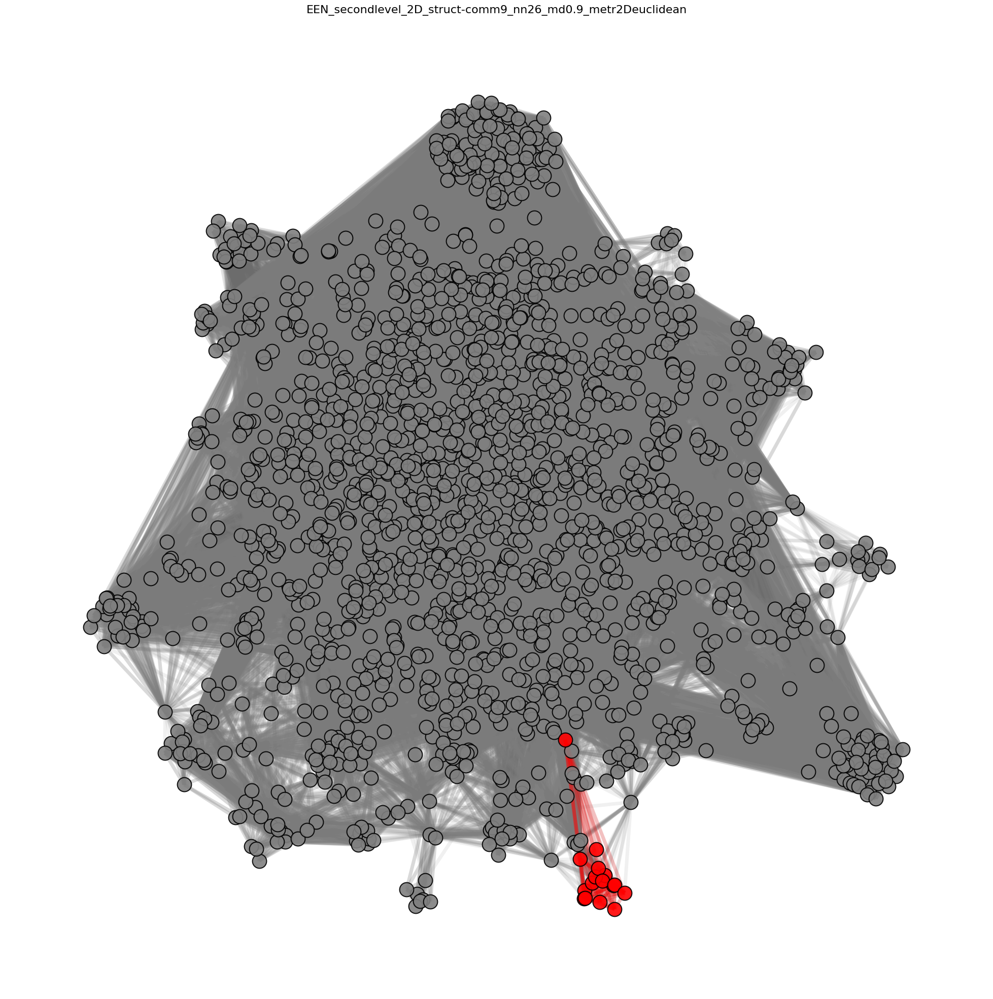

In [130]:
check_colors_allcommunities_firstlevel=[]
for i in range(len(colors_allcommunities_firstlevel)):
    if i==45:   
        check_colors_allcommunities_firstlevel.append("red")
    else:
        check_colors_allcommunities_firstlevel.append("grey")


plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges accross communities 
nx.draw_networkx_edges(G_sub_second, posG2D_third, width = 5, edge_color = '#6C6C6C', alpha = 0.1)

# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*6, 
                            node_color = check_colors_allcommunities_firstlevel[i], 
                            node_size = 400, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 5.0, edge_color = check_colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)


plt.show()

In [129]:
for i in range(len(set_communities)):
    if subgraphs_allcommunities_firstlevel[i].number_of_nodes()==16:
        if subgraphs_allcommunities_firstlevel[i].number_of_edges()==104:
            print(i)

45


### FIRST LEVEL

Number of exposures in community: 13
Specific Graph: Graph with 13 nodes and 70 edges


/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Number of Nodes: (to match G_sub_first nodes):  13
communities of second level in third level community selected:  {249}
number of unique colors: 1
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1
Number of individual colors:  1


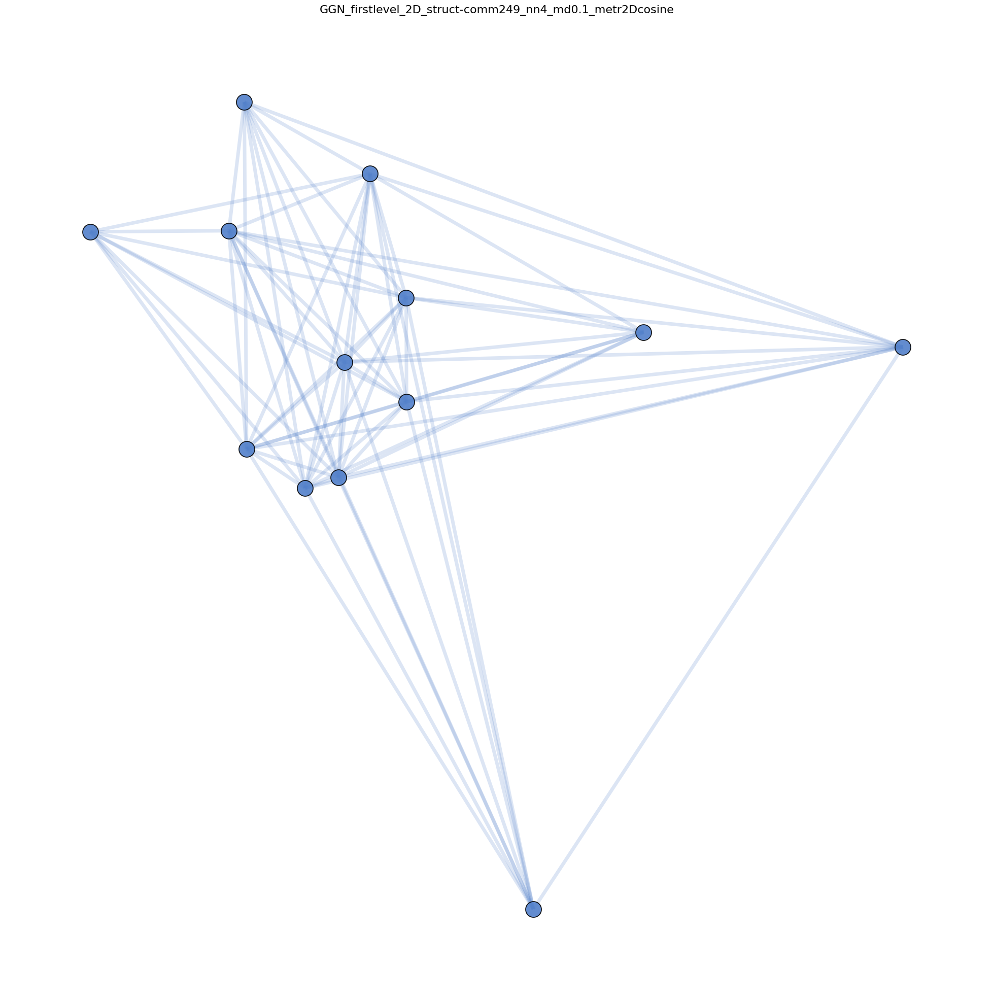

In [24]:
layoutname = 'firstlevel'

##########################################################
spec_comm_first = 249 #Salvo's selection 5_19
##########################################################

sublist_first = []
for k,v in d_comm_first.items():
    if v == spec_comm_first:
        sublist_first.append(k)

d_selectedcommunity_firstlevel = {spec_comm_first:sublist_first}
print("Number of exposures in community:" , len(*d_selectedcommunity_firstlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_first.values()),max(d_comm_first.values())+1):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_first = subgraphs_subcommunities[spec_comm_first]
print("Specific Graph:" , G_sub_first)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_first) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_first, nodelist=list(G_sub_first.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_first.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_first.nodes())
FM_structural_sub.columns=list(G_sub_first.nodes())

n_n = 4
spr = 1.0
md = 0.1
metr2D = 'cosine'
posG2D_first = layout_portrait_umap(G_sub_first,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_first nodes): ', len(posG2D_first))

########################################
# COLORS 
########################################

d_comm_first_selected = {}
for node in G_sub_first.nodes():
    d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get unique color for each community 
colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(set_communities))
colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign previously assigned color (to remain same)
d_comm_col_new = {spec_comm_first:d_comm_col[spec_comm_first]} # dict(zip(set_communities , colorlist_fin))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_second.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items(): # or use posG2D_third/second/first
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_firstlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col_new.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))


#######################################
# PLOT  
########################################

fname = 'GGN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)
#plt.savefig('output/Figures/SF6A_part3_v01_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/SF6A_part3_v01_post_rev.png',dpi=300)
plt.show()

In [25]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_first.items():

    community_id = d_comm_first_selected.get(node)
    node_color = d_comm_col_new.get(community_id, "#000000")

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 500,      # same as plot
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None,
        "edge_alpha": None
    })


# ----------------------------
# EDGES (ALL EDGES in G_sub_first)
# ----------------------------
for u, v in G_sub_first.edges():

    comm_u = d_comm_first_selected.get(u, -1)
    comm_v = d_comm_first_selected.get(v, -1)

    # since this is a single first-level community,
    # all edges are within-community
    if comm_u == comm_v:
        edge_color = d_comm_col_new.get(comm_u, "#000000")
        edge_width = 5.0        # 2.0 * 2.5 from plot
        edge_alpha = 0.2
    else:
        edge_color = "#A1A1A1"
        edge_width = 0.1
        edge_alpha = 0.25

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })


# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork_first = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork_first[df_subnetwork_first['row_type']=="node"]))
print("Edges:", len(df_subnetwork_first[df_subnetwork_first['row_type']=="edge"]))


# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork_first.to_excel(
        writer,
        sheet_name="SF13A_part4",
        index=False
    )

print("First-level subnetwork saved successfully.")

Nodes: 13
Edges: 70
First-level subnetwork saved successfully.


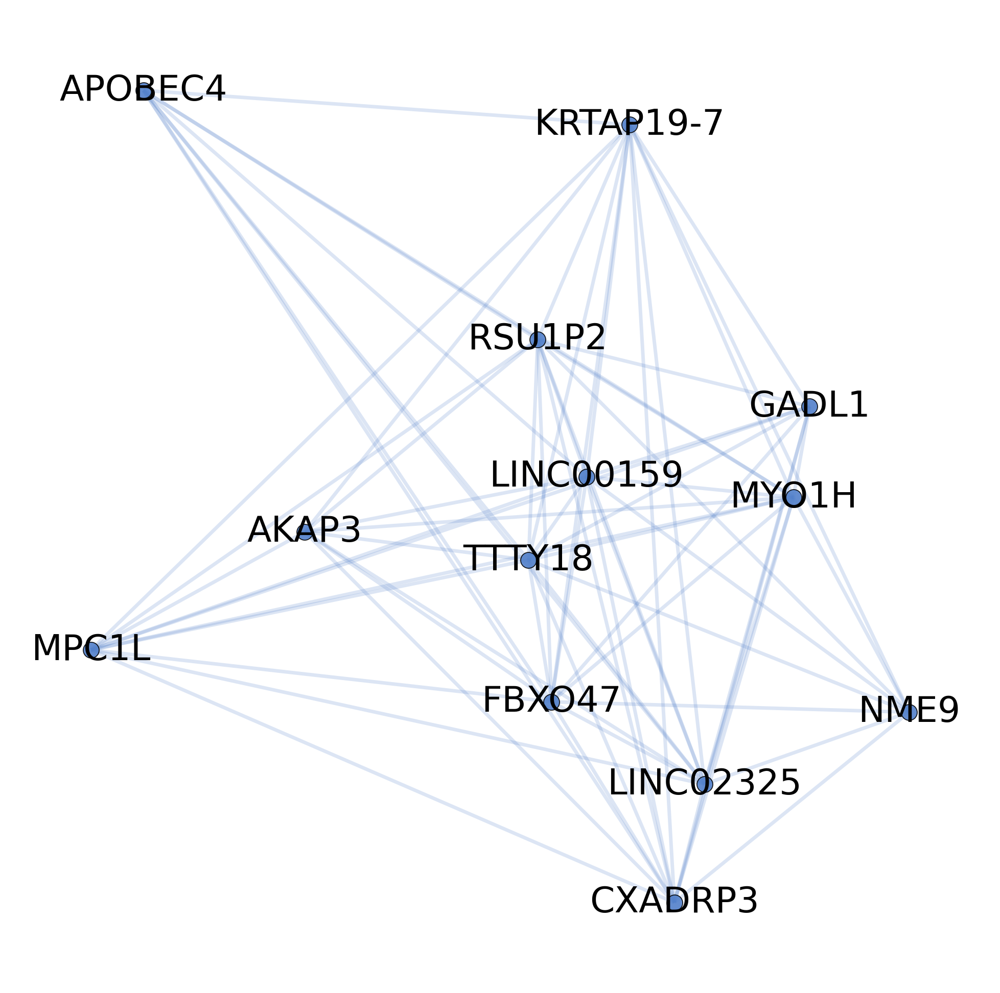

In [104]:
plt.figure(figsize=(25,25))
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)
    nx.draw_networkx_labels(subgraphs_allcommunities_firstlevel[i], dict(*pos2D_allcommunities_firstlevel[i]),  font_color = 'black',font_size=50)
plt.box(False)
#plt.savefig('output/Figures/SF8A_part3_v03_ann.png',dpi=300)
plt.show()

Number of exposures in community: 16
Specific Graph: Graph with 16 nodes and 104 edges
Number of Nodes: (to match G_sub_first nodes):  16
communities of second level in third level community selected:  {222}
number of unique colors: 1
Number of subgraphs: 1
Number of second level communities:  1
Number of position-sublists: 1
Number of individual colors:  1


/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/Epigenetics/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


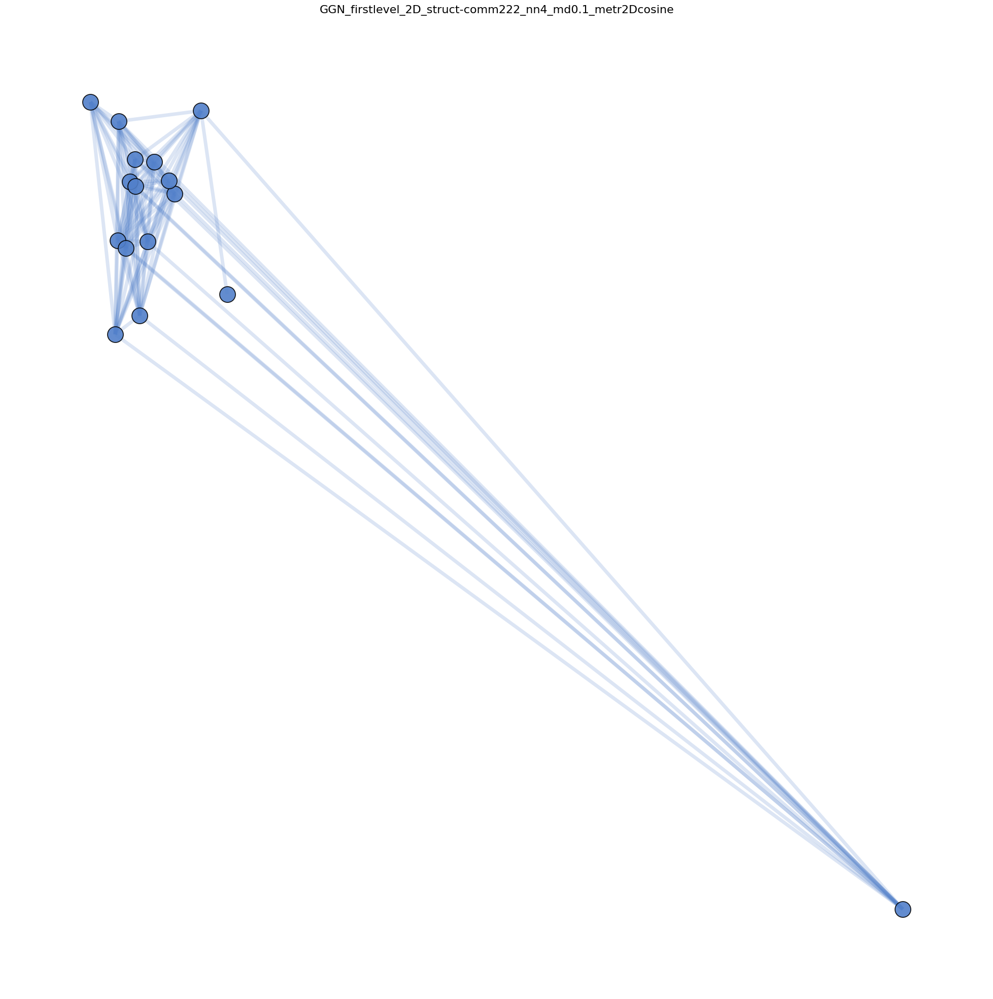

In [26]:
layoutname = 'firstlevel'

##########################################################
spec_comm_first = 222 #Salvo's selection 5_16
##########################################################

sublist_first = []
for k,v in d_comm_first.items():
    if v == spec_comm_first:
        sublist_first.append(k)

d_selectedcommunity_firstlevel = {spec_comm_first:sublist_first}
print("Number of exposures in community:" , len(*d_selectedcommunity_firstlevel.values()))
###########################################################

# get all subgraphs of all communities : 
nodes_subcommunities = []
subgraphs_subcommunities = []

for number_of_community in range(min(d_comm_first.values()),max(d_comm_first.values())+1):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G.subgraph(nodes_comm)

    nodes_subcommunities.append(nodes_comm)
    subgraphs_subcommunities.append(G_comm)
    
G_sub_first = subgraphs_subcommunities[spec_comm_first]
print("Specific Graph:" , G_sub_first)


########################################
# LAYOUT 
########################################

layout_method = 'struct-comm'+str(spec_comm_first) 

r = 0.9
alpha = 1.0

A_sub = nx.adjacency_matrix(G_sub_first, nodelist=list(G_sub_first.nodes()))
DM_m_sub = rnd_walk_matrix2(A_sub, r, alpha, len(G_sub_first.nodes()))
FM_structural_sub = pd.DataFrame(DM_m_sub)
FM_structural_sub.sum(axis=1) # axis=1 for columns i.e. features = sum 1
FM_structural_sub.index=list(G_sub_first.nodes())
FM_structural_sub.columns=list(G_sub_first.nodes())

n_n = 4
spr = 1.0
md = 0.1
metr2D = 'cosine'
posG2D_first = layout_portrait_umap(G_sub_first,
                                   FM_structural_sub, #FM_communities_sub, #df_posG,
                                   2,
                                   n_neighbors=n_n, 
                                   spread=spr, 
                                   min_dist=md, 
                                   metric=metr2D
                                  )

print('Number of Nodes: (to match G_sub_first nodes): ', len(posG2D_first))

########################################
# COLORS 
########################################

d_comm_first_selected = {}
for node in G_sub_first.nodes():
    d_comm_first_selected[node] = d_comm_first[node]
print("communities of second level in third level community selected: ", set(d_comm_first_selected.values()))

set_communities = set(d_comm_first_selected.values())

# get unique color for each community 
colorlist_fin_rgb = sns.color_palette("gist_rainbow", n_colors = len(set_communities))
colorlist_fin = [mcolors.to_hex(rgb) for rgb in colorlist_fin_rgb]
#random.shuffle(colorlist_fin)
print("number of unique colors:" ,len(set(colorlist_fin)))

# assign previously assigned color (to remain same)
#d_comm_col_new = {spec_comm_first:d_comm_col[spec_comm_first]} # dict(zip(set_communities , colorlist_fin))

opacity_nodes = 0.9
node_edge_col = '#000000' 
node_linewidth = 0.25
edge_opacity = 0.25
edge_width = 0.1
edge_color = '#A1A1A1'


#########################################
# subsets according to sublevel communities 
########################################

# get all subgraphs of all communities : 
nodes_allcommunities_firstlevel = []
subgraphs_allcommunities_firstlevel = []

for number_of_community in list(set_communities):
    nodes_comm = []
    for node, comm in d_comm_first.items(): 
        if comm == number_of_community:
            nodes_comm.append(node)
            G_comm = G_sub_second.subgraph(nodes_comm)

    nodes_allcommunities_firstlevel.append(nodes_comm)
    subgraphs_allcommunities_firstlevel.append(G_comm)
print("Number of subgraphs:", len(subgraphs_allcommunities_firstlevel))
print("Number of second level communities: ", len(nodes_allcommunities_firstlevel))

# get sub of positions according to communities in more detailed level 
pos2D_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        pos_comm = []
        if i == idx:
            # get positions from community nodes
            posG2D_comm = {}
            for k,v in posG2D_third.items(): # or use posG2D_third/second/first
                if k in n_comm:
                    posG2D_comm[k] = v 
        pos_comm.append(posG2D_comm)

    pos2D_allcommunities_firstlevel.append(pos_comm)
print("Number of position-sublists:", len(pos2D_allcommunities_firstlevel))

colors_allcommunities_firstlevel = []

for idx,number_of_community in enumerate(list(set_communities)):
    for i,n_comm in enumerate(nodes_allcommunities_firstlevel):
        # get color from community  
        for comm, col in d_comm_col_new.items():
            if comm == number_of_community:
                comm0_color = col
    colors_allcommunities_firstlevel.append(comm0_color)

print("Number of individual colors: ", len(set(colors_allcommunities_firstlevel)))


#######################################
# PLOT  
########################################

fname = 'GGN_'+layoutname+'_2D_'+layout_method+'_nn'+str(n_n)+'_md'+str(md)+'_metr2D'+metr2D
plt.figure(figsize=(25,25))
plt.title(fname, size=16)

# draw network edges all (very transparent)
#nx.draw_networkx_edges(G_sub_third, posG2D_third, width = 1, edge_color = '#6C6C6C', alpha = 0.1)


# draw network edges within communities 
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)

plt.box(False)
#plt.savefig('output/Figures/SF6A_part4_v01_post_rev.pdf',dpi=300)
#plt.savefig('output/Figures/SF6A_part4_v01_post_rev.png',dpi=300)
plt.show()

In [27]:

rows = []

# ----------------------------
# NODES
# ----------------------------
for node, (x, y) in posG2D_first.items():

    community_id = d_comm_first_selected.get(node)
    node_color = d_comm_col_new.get(community_id, "#000000")

    rows.append({
        "row_type": "node",
        "node_id": node,
        "x": x,
        "y": y,
        "community_id": community_id,
        "node_color": node_color,
        "node_size": 500,      # same as plot
        "source": None,
        "target": None,
        "edge_color": None,
        "edge_width": None,
        "edge_alpha": None
    })


# ----------------------------
# EDGES (ALL EDGES in G_sub_first)
# ----------------------------
for u, v in G_sub_first.edges():

    comm_u = d_comm_first_selected.get(u, -1)
    comm_v = d_comm_first_selected.get(v, -1)

    # since this is a single first-level community,
    # all edges are within-community
    if comm_u == comm_v:
        edge_color = d_comm_col_new.get(comm_u, "#000000")
        edge_width = 5.0        # 2.0 * 2.5 from plot
        edge_alpha = 0.2
    else:
        edge_color = "#A1A1A1"
        edge_width = 0.1
        edge_alpha = 0.25

    rows.append({
        "row_type": "edge",
        "node_id": None,
        "x": None,
        "y": None,
        "community_id": None,
        "node_color": None,
        "node_size": None,
        "source": u,
        "target": v,
        "edge_color": edge_color,
        "edge_width": edge_width,
        "edge_alpha": edge_alpha
    })


# ----------------------------
# CREATE DATAFRAME
# ----------------------------
df_subnetwork_first = pd.DataFrame(rows)

print("Nodes:", len(df_subnetwork_first[df_subnetwork_first['row_type']=="node"]))
print("Edges:", len(df_subnetwork_first[df_subnetwork_first['row_type']=="edge"]))


# ----------------------------
# SAVE TO EXCEL
# ----------------------------
out_file = "output/Source_Data_exposurome.xlsx"

with pd.ExcelWriter(out_file, engine="openpyxl", mode="a", if_sheet_exists="replace") as writer:
    df_subnetwork_first.to_excel(
        writer,
        sheet_name="SF13A_part5",
        index=False
    )

print("First-level subnetwork saved successfully.")

Nodes: 16
Edges: 104
First-level subnetwork saved successfully.


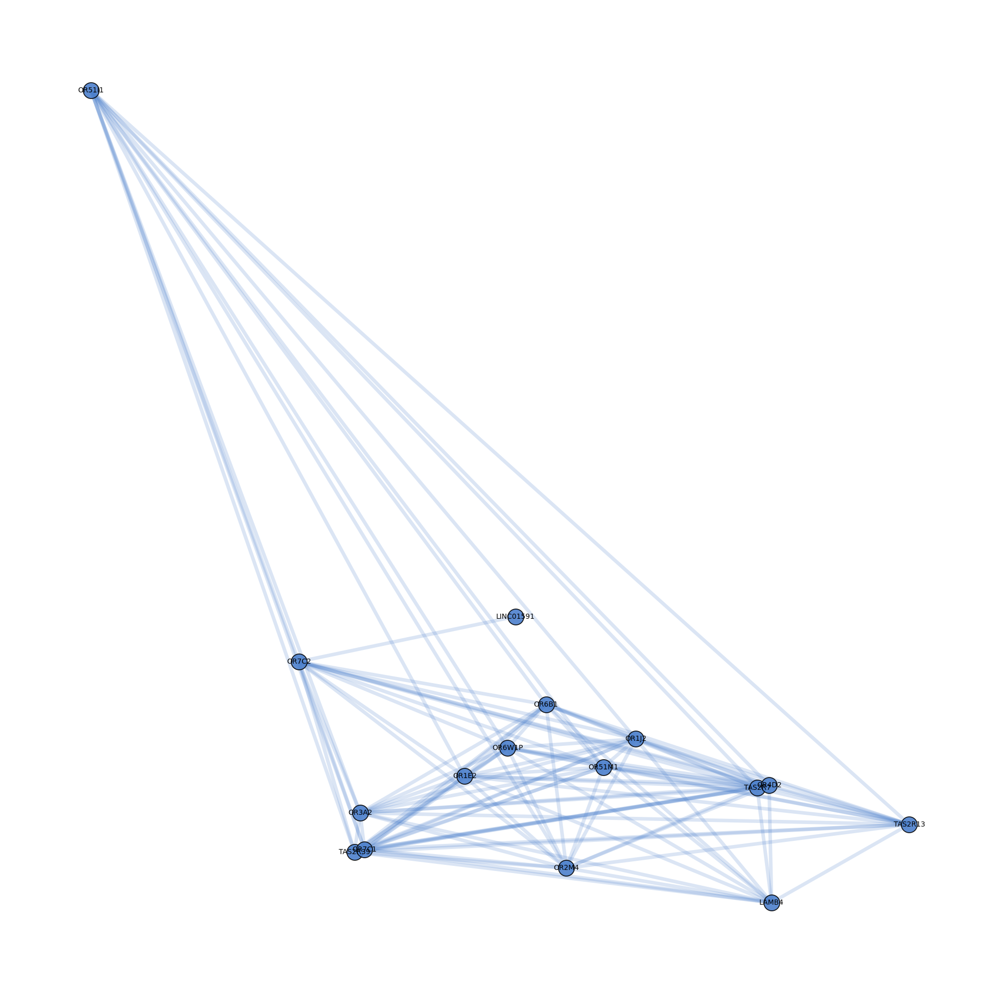

In [133]:
plt.figure(figsize=(25,25))
for i in range(len(set_communities)):
    nx.draw_networkx_nodes(subgraphs_allcommunities_firstlevel[i],
                            dict(*pos2D_allcommunities_firstlevel[i]), 
                            edgecolors = node_edge_col, 
                            linewidths = node_linewidth*5, 
                            node_color = colors_allcommunities_firstlevel[i], 
                            node_size = 500, alpha = opacity_nodes)
    nx.draw_networkx_edges(subgraphs_allcommunities_firstlevel[i],dict(*pos2D_allcommunities_firstlevel[i]), width = 2.0*2.5, edge_color = colors_allcommunities_firstlevel[i], alpha = 0.2)
    nx.draw_networkx_labels(subgraphs_allcommunities_firstlevel[i], dict(*pos2D_allcommunities_firstlevel[i]),  font_color = 'black',font_size=10)
plt.box(False)

plt.show()